# Project 5: NLP on Financial Statements
## Instructions
Each problem consists of a function to implement and instructions on how to implement the function.  The parts of the function that need to be implemented are marked with a `# TODO` comment. After implementing the function, run the cell to test it against the unit tests we've provided. For each problem, we provide one or more unit tests from our `project_tests` package. These unit tests won't tell you if your answer is correct, but will warn you of any major errors. Your code will be checked for the correct solution when you submit it to Udacity.

## Packages
When you implement the functions, you'll only need to you use the packages you've used in the classroom, like [Pandas](https://pandas.pydata.org/) and [Numpy](http://www.numpy.org/). These packages will be imported for you. We recommend you don't add any import statements, otherwise the grader might not be able to run your code.

The other packages that we're importing are `project_helper` and `project_tests`. These are custom packages built to help you solve the problems.  The `project_helper` module contains utility functions and graph functions. The `project_tests` contains the unit tests for all the problems.

### Install Packages

In [1]:
import sys
!{sys.executable} -m pip install -r requirements.txt

  Using cached numpy-1.13.3-cp36-none-win_amd64.whl (13.1 MB)
  Using cached requests-2.18.4-py2.py3-none-any.whl (88 kB)
  Using cached scikit_learn-0.19.1-cp36-cp36m-win_amd64.whl (4.3 MB)
  Using cached six-1.11.0-py2.py3-none-any.whl (10 kB)
  Using cached tqdm-4.19.5-py2.py3-none-any.whl (51 kB)
  Using cached chardet-3.0.4-py2.py3-none-any.whl (133 kB)
  Using cached scipy-1.4.1-cp36-cp36m-win_amd64.whl (30.8 MB)
  Created wheel for alphalens: filename=alphalens-0.3.2-py3-none-any.whl size=18881520 sha256=0b0e9fb218725658bf24c5cbdddad1d83d578259b69b6a0295c043b9fbe1a658
  Stored in directory: c:\users\phil\appdata\local\pip\cache\wheels\1c\9e\b8\a502db514b9cf748687129d96fb1f8156f47ef6ab450abf4d0
  Created wheel for nltk: filename=nltk-3.3-py3-none-any.whl size=1394469 sha256=a77b21182eb8bd360192a4ca28b513c3a863d7fb570f85718878db35d52ce7ad
  Stored in directory: c:\users\phil\appdata\local\pip\cache\wheels\b8\d8\07\964296f9959518c893c0b204d2a4d28195e884047baba6b4fe
  Created wheel 

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mkl-fft 1.2.0 requires numpy>=1.16, but you have numpy 1.13.3 which is incompatible.
gym 0.18.0 requires Pillow<=7.2.0, but you have pillow 8.1.0 which is incompatible.
cvxpy 1.1.7 requires numpy>=1.15, but you have numpy 1.13.3 which is incompatible.


### Load Packages

In [2]:
import nltk
import numpy as np
import pandas as pd
import pickle
import pprint
import project_helper
import project_tests

from tqdm import tqdm

RuntimeError: module compiled against API version 0xc but this version of numpy is 0xb

### Download NLP Corpora
You'll need two corpora to run this project: the stopwords corpus for removing stopwords and wordnet for lemmatizing.

In [3]:
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Phil\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Phil\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\wordnet.zip.


True

## Get 10ks
We'll be running NLP analysis on 10-k documents. To do that, we first need to download the documents. For this project, we'll download 10-ks for a few companies. To lookup documents for these companies, we'll use their CIK. If you would like to run this against other stocks, we've provided the dict `additional_cik` for more stocks. However, the more stocks you try, the long it will take to run.

In [4]:
cik_lookup = {
    'AMZN': '0001018724',
    'BMY': '0000014272',   
    'CNP': '0001130310',
    'CVX': '0000093410',
    'FL': '0000850209',
    'FRT': '0000034903',
    'HON': '0000773840'}

additional_cik = {
    'AEP': '0000004904',
    'AXP': '0000004962',
    'BA': '0000012927', 
    'BK': '0001390777',
    'CAT': '0000018230',
    'DE': '0000315189',
    'DIS': '0001001039',
    'DTE': '0000936340',
    'ED': '0001047862',
    'EMR': '0000032604',
    'ETN': '0001551182',
    'GE': '0000040545',
    'IBM': '0000051143',
    'IP': '0000051434',
    'JNJ': '0000200406',
    'KO': '0000021344',
    'LLY': '0000059478',
    'MCD': '0000063908',
    'MO': '0000764180',
    'MRK': '0000310158',
    'MRO': '0000101778',
    'PCG': '0001004980',
    'PEP': '0000077476',
    'PFE': '0000078003',
    'PG': '0000080424',
    'PNR': '0000077360',
    'SYY': '0000096021',
    'TXN': '0000097476',
    'UTX': '0000101829',
    'WFC': '0000072971',
    'WMT': '0000104169',
    'WY': '0000106535',
    'XOM': '0000034088'}

### Get list of 10-ks
The SEC has a limit on the number of calls you can make to the website per second. In order to avoid hiding that limit, we've created the `SecAPI` class. This will cache data from the SEC and prevent you from going over the limit.

In [5]:
sec_api = project_helper.SecAPI()

With the class constructed, let's pull a list of filled 10-ks from the SEC for each company.

In [17]:
from bs4 import BeautifulSoup

def get_sec_data(cik, doc_type, start=0, count=60):
    newest_pricing_data = pd.to_datetime('2018-01-01')
    rss_url = 'https://www.sec.gov/cgi-bin/browse-edgar?action=getcompany' \
        '&CIK={}&type={}&start={}&count={}&owner=exclude&output=atom' \
        .format(cik, doc_type, start, count)
    sec_data = sec_api.get(rss_url)
    feed = BeautifulSoup(sec_data.encode('ascii'), 'xml').feed
    entries = [
        (
            entry.content.find('filing-href').getText(),
            entry.content.find('filing-type').getText(),
            entry.content.find('filing-date').getText())
        for entry in feed.find_all('entry', recursive=False)
        if pd.to_datetime(entry.content.find('filing-date').getText()) <= newest_pricing_data]

    return entries

Let's pull the list using the `get_sec_data` function, then display some of the results. For displaying some of the data, we'll use Amazon as an example. 

In [18]:
example_ticker = 'AMZN'
sec_data = {}

for ticker, cik in cik_lookup.items():
    sec_data[ticker] = get_sec_data(cik, '10-K')

pprint.pprint(sec_data[example_ticker][:5])

[('https://www.sec.gov/Archives/edgar/data/1018724/000101872417000011/0001018724-17-000011-index.htm',
  '10-K',
  '2017-02-10'),
 ('https://www.sec.gov/Archives/edgar/data/1018724/000101872416000172/0001018724-16-000172-index.htm',
  '10-K',
  '2016-01-29'),
 ('https://www.sec.gov/Archives/edgar/data/1018724/000101872415000006/0001018724-15-000006-index.htm',
  '10-K',
  '2015-01-30'),
 ('https://www.sec.gov/Archives/edgar/data/1018724/000101872414000006/0001018724-14-000006-index.htm',
  '10-K',
  '2014-01-31'),
 ('https://www.sec.gov/Archives/edgar/data/1018724/000119312513028520/0001193125-13-028520-index.htm',
  '10-K',
  '2013-01-30')]


### Download 10-ks
As you see, this is a list of urls. These urls point to a file that contains metadata related to each filling. Since we don't care about the metadata, we'll pull the filling by replacing the url with the filling url.

In [19]:
raw_fillings_by_ticker = {}

for ticker, data in sec_data.items():
    raw_fillings_by_ticker[ticker] = {}
    for index_url, file_type, file_date in tqdm(data, desc='Downloading {} Fillings'.format(ticker), unit='filling'):
        if (file_type == '10-K'):
            file_url = index_url.replace('-index.htm', '.txt').replace('.txtl', '.txt')            
            
            raw_fillings_by_ticker[ticker][file_date] = sec_api.get(file_url)


print('Example Document:\n\n{}...'.format(next(iter(raw_fillings_by_ticker[example_ticker].values()))[:1000]))

Example Document:

<SEC-DOCUMENT>0001018724-17-000011.txt : 20170210
<SEC-HEADER>0001018724-17-000011.hdr.sgml : 20170210
<ACCEPTANCE-DATETIME>20170209175636
ACCESSION NUMBER:		0001018724-17-000011
CONFORMED SUBMISSION TYPE:	10-K
PUBLIC DOCUMENT COUNT:		92
CONFORMED PERIOD OF REPORT:	20161231
FILED AS OF DATE:		20170210
DATE AS OF CHANGE:		20170209

FILER:

	COMPANY DATA:	
		COMPANY CONFORMED NAME:			AMAZON COM INC
		CENTRAL INDEX KEY:			0001018724
		STANDARD INDUSTRIAL CLASSIFICATION:	RETAIL-CATALOG & MAIL-ORDER HOUSES [5961]
		IRS NUMBER:				911646860
		STATE OF INCORPORATION:			DE
		FISCAL YEAR END:			1231

	FILING VALUES:
		FORM TYPE:		10-K
		SEC ACT:		1934 Act
		SEC FILE NUMBER:	000-22513
		FILM NUMBER:		17588807

	BUSINESS ADDRESS:	
		STREET 1:		410 TERRY AVENUE NORTH
		CITY:			SEATTLE
		STATE:			WA
		ZIP:			98109
		BUSINESS PHONE:		2062661000

	MAIL ADDRESS:	
		STREET 1:		410 TERRY AVENUE NORTH
		CITY:			SEATTLE
		STATE:			WA
		ZIP:			98109
</SEC-HEADER>
<DOCUMENT>
<TYPE>10-K
<S

### Get Documents
With theses fillings downloaded, we want to break them into their associated documents. These documents are sectioned off in the fillings with the tags `<DOCUMENT>` for the start of each document and `</DOCUMENT>` for the end of each document. There's no overlap with these documents, so each `</DOCUMENT>` tag should come after the `<DOCUMENT>` with no `<DOCUMENT>` tag in between.

Implement `get_documents` to return a list of these documents from a filling. Make sure not to include the tag in the returned document text.

In [20]:
import re


def get_documents(text):
    """
    Extract the documents from the text

    Parameters
    ----------
    text : str
        The text with the document strings inside

    Returns
    -------
    extracted_docs : list of str
        The document strings found in `text`
    """
    
    # TODO: Implement
    
    extracted_docs = re.compile('<DOCUMENT>(.*?)</DOCUMENT>', re.DOTALL).findall(text)
    
    print(extracted_docs)
    return extracted_docs


project_tests.test_get_documents(get_documents)

['\nThis is inside the document\nThis is the text that should be copied']
['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>test-20171231x10k.htm\n<DESCRIPTION>10-K\n<TEXT>\n<!DOCTYPE html PUBLIC "-//W3C//DTD HTML 4.01 Transitional//EN" "http://www.w3.org/TR/html4/loose.dtd">\n<html>\n\t<head>\n\t\t<title>Document</title>\n\t</head>\n\t<body style="font-family:Times New Roman;font-size:10pt;">\n...\n<td><strong> Data Type:</strong></td>\n<td>xbrli:sharesItemType</td>\n</tr>\n<tr>\n<td><strong> Balance Type:</strong></td>\n<td>na</td>\n</tr>\n<tr>\n<td><strong> Period Type:</strong></td>\n<td>duration</td>\n</tr>\n</table></div>\n</div></td></tr>\n</table>\n</div>\n</body>\n</html>\n</TEXT>\n', '\n<TYPE>EXCEL\n<SEQUENCE>106\n<FILENAME>Financial_Report.xlsx\n<DESCRIPTION>IDEA: XBRL DOCUMENT\n<TEXT>\nbegin 644 Financial_Report.xlsx\nM4$L#!!0    ( %"E04P?(\\#P    !,"   +    7W)E;,O+G)E;.MDD^+\nMPD ,Q;]*F?L:5\\#8CUYZ6U9_ )Q)OU#.Y,A$[%^>X>];+=44/ 87O+>CT?V\n...\nM,C,Q7V1E9BYX;6Q02P$"% ,4    " !0I4%,>V7

With the `get_documents` function implemented, let's extract all the documents.

In [21]:
filling_documents_by_ticker = {}

for ticker, raw_fillings in raw_fillings_by_ticker.items():
    filling_documents_by_ticker[ticker] = {}
    for file_date, filling in tqdm(raw_fillings.items(), desc='Getting Documents from {} Fillings'.format(ticker), unit='filling'):
        filling_documents_by_ticker[ticker][file_date] = get_documents(filling)


'''print('\n\n'.join([
    'Document {} Filed on {}:\n{}...'.format(doc_i, file_date, doc[:200])
    for file_date, docs in filling_documents_by_ticker[example_ticker].items()
    for doc_i, doc in enumerate(docs)][:3]))'''

Getting Documents from AMZN Fillings:   0%|                                                | 0/17 [00:00<?, ?filling/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from AMZN Fillings:   6%|██▎                                     | 1/17 [00:01<00:18,  1.17s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from AMZN Fillings:  12%|████▋                                   | 2/17 [00:02<00:15,  1.04s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from AMZN Fillings:  18%|███████                                 | 3/17 [00:03<00:15,  1.12s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from AMZN Fillings:  24%|█████████▍                              | 4/17 [00:04<00:15,  1.16s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from AMZN Fillings:  29%|███████████▊                            | 5/17 [00:05<00:13,  1.14s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from AMZN Fillings:  35%|██████████████                          | 6/17 [00:06<00:12,  1.10s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from AMZN Fillings:  41%|████████████████▍                       | 7/17 [00:07<00:10,  1.09s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from AMZN Fillings:  47%|██████████████████▊                     | 8/17 [00:08<00:09,  1.00s/filling]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>d10k.htm\n<DESCRIPTION>FORM 10-K\n<TEXT>\n<HTML><HEAD>\n<TITLE>Form 10-K</TITLE>\n</HEAD>\n <BODY BGCOLOR="WHITE">\n<h5 align="left"><a href="#toc">Table of Contents</a></h5>\n\n <P STYLE="line-height:0px;margin-top:0px;margin-bottom:0px;border-bottom:0.5pt solid #000000">&nbsp;</P> <P\nSTYLE="line-height:3px;margin-top:0px;margin-bottom:2px;border-bottom:0.5pt solid #000000">&nbsp;</P> <P STYLE="margin-top:6px;margin-bottom:0px" ALIGN="center"><FONT FACE="Times New Roman" SIZE="5"><B>UNITED STATES </B></FONT></P> <P\nSTYLE="margin-top:0px;margin-bottom:0px" ALIGN="center"><FONT FACE="Times New Roman" SIZE="5"><B>SECURITIES AND EXCHANGE COMMISSION </B></FONT></P> <P STYLE="margin-top:0px;margin-bottom:0px" ALIGN="center"><FONT FACE="Times New Roman"\nSIZE="3"><B>Washington, D.C. 20549 </B></FONT></P> <P STYLE="font-size:3px;margin-top:0px;margin-bottom:0px">&nbsp;</P><center> <P STYLE="line-height:6px;margin-top:0px;margin-bottom:2px;border-bottom

Getting Documents from AMZN Fillings:  53%|█████████████████████▏                  | 9/17 [00:08<00:07,  1.10filling/s]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>d10k.htm\n<DESCRIPTION>FORM 10-K\n<TEXT>\n<HTML><HEAD>\n<TITLE>Form 10-K</TITLE>\n</HEAD>\n <BODY BGCOLOR="WHITE">\n<h5 align="left"><a href="#toc">Table of Contents</a></h5>\n\n <P STYLE="line-height:0px;margin-top:0px;margin-bottom:0px;border-bottom:0.5pt solid #000000">&nbsp;</P> <P\nSTYLE="line-height:3px;margin-top:0px;margin-bottom:2px;border-bottom:0.5pt solid #000000">&nbsp;</P> <P STYLE="margin-top:4px;margin-bottom:0px" ALIGN="center"><FONT FACE="Times New Roman" SIZE="5"><B>UNITED STATES </B></FONT></P> <P\nSTYLE="margin-top:0px;margin-bottom:0px" ALIGN="center"><FONT FACE="Times New Roman" SIZE="5"><B>SECURITIES AND EXCHANGE COMMISSION </B></FONT></P> <P STYLE="margin-top:6px;margin-bottom:0px" ALIGN="center"><FONT FACE="Times New Roman"\nSIZE="2"><B>Washington, D.C. 20549 </B></FONT></P> <P STYLE="font-size:6px;margin-top:0px;margin-bottom:0px">&nbsp;</P><center> <P STYLE="line-height:6px;margin-top:0px;margin-bottom:2px;border-bottom

Getting Documents from AMZN Fillings:  59%|██████████████████████▉                | 10/17 [00:08<00:05,  1.20filling/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:   4%|█▊                                       | 1/23 [00:02<00:53,  2.44s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:   9%|███▌                                     | 2/23 [00:04<00:51,  2.48s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  13%|█████▎                                   | 3/23 [00:08<00:54,  2.74s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  17%|███████▏                                 | 4/23 [00:11<00:55,  2.92s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  22%|████████▉                                | 5/23 [00:14<00:50,  2.81s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  26%|██████████▋                              | 6/23 [00:16<00:45,  2.69s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  30%|████████████▍                            | 7/23 [00:19<00:44,  2.77s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  35%|██████████████▎                          | 8/23 [00:20<00:38,  2.54s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  39%|████████████████                         | 9/23 [00:20<00:32,  2.30s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  43%|█████████████████▍                      | 10/23 [00:20<00:27,  2.10s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  48%|███████████████████▏                    | 11/23 [00:21<00:23,  1.94s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  52%|████████████████████▊                   | 12/23 [00:21<00:19,  1.80s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from BMY Fillings:  57%|██████████████████████▌                 | 13/23 [00:21<00:16,  1.69s/filling]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>d10k.htm\n<DESCRIPTION>FORM 10-K\n<TEXT>\n<HTML><HEAD>\n<TITLE>Form 10-K</TITLE>\n</HEAD>\n <BODY BGCOLOR="WHITE">\n\n<HR SIZE="3" NOSHADE COLOR="#000000" ALIGN="left"> <P STYLE="margin-top:0px;margin-bottom:0px"><FONT SIZE="1">&nbsp;</FONT></P> <P STYLE="margin-top:0px;margin-bottom:0px" ALIGN="center"><FONT\nFACE="Times New Roman" SIZE="5"><B>UNITED STATES </B></FONT></P> <P STYLE="margin-top:0px;margin-bottom:0px" ALIGN="center"><FONT FACE="Times New Roman" SIZE="5"><B>SECURITIES AND EXCHANGE COMMISSION </B></FONT></P> <P\nSTYLE="margin-top:0px;margin-bottom:0px" ALIGN="center"><FONT FACE="Times New Roman" SIZE="3"><B>Washington, D.C. 20549 </B></FONT></P> <P STYLE="margin-top:0px;margin-bottom:0px"><FONT SIZE="1">&nbsp;</FONT></P> <P\nSTYLE="margin-top:0px;margin-bottom:0px" ALIGN="center"><FONT FACE="Times New Roman" SIZE="5"><B>FORM 10-K </B></FONT></P> <P STYLE="margin-top:0px;margin-bottom:0px"><FONT SIZE="1">&nbsp;</FONT></P> <P STYLE="ma

Getting Documents from BMY Fillings:  61%|████████████████████████▎               | 14/23 [00:22<00:14,  1.59s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CNP Fillings:  13%|█████▍                                   | 2/15 [00:03<00:25,  1.97s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CNP Fillings:  20%|████████▏                                | 3/15 [00:06<00:26,  2.21s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CNP Fillings:  27%|██████████▉                              | 4/15 [00:09<00:25,  2.34s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CNP Fillings:  33%|█████████████▋                           | 5/15 [00:11<00:23,  2.35s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CNP Fillings:  40%|████████████████▍                        | 6/15 [00:14<00:21,  2.35s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CNP Fillings:  47%|███████████████████▏                     | 7/15 [00:14<00:16,  2.08s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CNP Fillings:  53%|█████████████████████▊                   | 8/15 [00:15<00:13,  1.95s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CNP Fillings:  60%|████████████████████████▌                | 9/15 [00:16<00:10,  1.78s/filling]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>h54051e10vk.htm\n<DESCRIPTION>FORM 10-K - ANNUAL REPORT\n<TEXT>\n<HTML>\n<HEAD>\n<TITLE>e10vk</TITLE>\n</HEAD>\n<BODY bgcolor="#FFFFFF">\n<!-- PAGEBREAK -->\n<H5 align="left" style="page-break-before:always"><A HREF="#tocpage">Table of Contents</A></H5><P>\n\n<DIV style="width: 87%; margin-left: 6%"><!-- BEGIN PAGE WIDTH -->\n</DIV><!-- END PAGE WIDTH -->\n<DIV style="width: 94%; margin-left: 3%"><!-- BEGIN PAGE WIDTH -->\n\n<CENTER style="font-size: 1pt; width: 100%; border-bottom: 2pt solid #000000"></CENTER><!-- callerid=999 iwidth=540 length=0 -->\n\n<CENTER style="font-size: 1pt; width: 100%; border-bottom: 1pt solid #000000"></CENTER><!-- callerid=999 iwidth=540 length=0 -->\n\n<DIV style="margin-top: 4pt; font-size: 1pt">&nbsp;</DIV>\n\n<DIV align="center" style="margin-left: 0%; margin-right: 0%; text-indent: 0%; font-size: 10pt; font-family: \'Times New Roman\', Times; color: #000000; background: #FFFFFF">\n    <B><FONT style="font-size: 

Getting Documents from CNP Fillings:  67%|██████████████████████████▋             | 10/15 [00:16<00:08,  1.62s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:   5%|█▉                                       | 1/21 [00:02<00:50,  2.52s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  10%|███▉                                     | 2/21 [00:04<00:45,  2.39s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  14%|█████▊                                   | 3/21 [00:07<00:45,  2.51s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  19%|███████▊                                 | 4/21 [00:10<00:46,  2.71s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  24%|█████████▊                               | 5/21 [00:15<00:48,  3.06s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  29%|███████████▋                             | 6/21 [00:16<00:42,  2.82s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  33%|█████████████▋                           | 7/21 [00:18<00:37,  2.70s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  38%|███████████████▌                         | 8/21 [00:19<00:31,  2.44s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  43%|█████████████████▌                       | 9/21 [00:20<00:26,  2.24s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  48%|███████████████████                     | 10/21 [00:20<00:22,  2.04s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  52%|████████████████████▉                   | 11/21 [00:20<00:18,  1.89s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  57%|██████████████████████▊                 | 12/21 [00:21<00:15,  1.75s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  62%|████████████████████████▊               | 13/21 [00:21<00:13,  1.64s/filling]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>f96742e10vk.htm\n<DESCRIPTION>FORM 10-K\n<TEXT>\n<HTML>\n<HEAD>\n<TITLE>e10vk</TITLE>\n</HEAD>\n<BODY bgcolor="#FFFFFF">\n<!-- PAGEBREAK -->\n<H5 align="left" style="page-break-before:always"><A HREF="#tocpage">Table of Contents</A></H5><P>\n\n<DIV align="center">\n<HR size="1" width="100%" align="center" noshade>\n</DIV>\n\n<DIV align="center">\n<HR size="1" width="100%" align="center" noshade>\n</DIV>\n\n<P align="center">\nUNITED STATES SECURITIES AND EXCHANGE COMMISSION\n\n<DIV align="center">\n<FONT size="2">Washington, D.C. 20549\n</FONT>\n</DIV>\n\n<DIV align="center">\n<B><FONT size="4">Form&nbsp;10-K</FONT></B>\n</DIV>\n<P>\n\n<TABLE width="100%" border="0" cellpadding="0" cellspacing="0">\n\n<TR>\n    <TD width="3%"></TD>\n    <TD width="97%"></TD>\n</TR>\n\n<TR valign="top">\n    <TD><B><FONT face="wingdings">&#254;</FONT></B>&nbsp;</TD>\n    <TD align="center">\n    ANNUAL REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE</TD>\n</TR>\n\n</

Getting Documents from CVX Fillings:  67%|██████████████████████████▋             | 14/21 [00:21<00:10,  1.54s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from CVX Fillings:  71%|████████████████████████████▌           | 15/21 [00:21<00:08,  1.46s/filling]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>0001.txt\n<DESCRIPTION>CHEVRON CORPORATION 2000 FORM 10-K\n<TEXT>\n\n                                      2000\n================================================================================\n\n                UNITED STATES SECURITIES AND EXCHANGE COMMISSION\n                             Washington, D.C. 20549\n\n                                    Form 10-K\n\n            |X| ANNUAL REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE\n                         SECURITIES EXCHANGE ACT OF 1934\n\n                   For the fiscal year ended December 31, 2000\n                                -----------------\n\n                                       OR\n\n            |_| TRANSITION REPORT PURSUANT TO SECTION 13 OR 15(d) OF THE\n                         SECURITIES EXCHANGE ACT OF 1934\n\n  For the transition period from              to\n                                 --------            ---------\n\n                         Commission File Number 1-36

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Getting Documents from FL Fillings:   6%|██▋                                       | 1/16 [00:01<00:25,  1.72s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  12%|█████▎                                    | 2/16 [00:03<00:23,  1.68s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  19%|███████▉                                  | 3/16 [00:05<00:22,  1.69s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  25%|██████████▌                               | 4/16 [00:06<00:20,  1.69s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  31%|█████████████▏                            | 5/16 [00:07<00:17,  1.60s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  38%|███████████████▊                          | 6/16 [00:09<00:15,  1.55s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  44%|██████████████████▍                       | 7/16 [00:09<00:12,  1.41s/filling]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>v177389_10k.htm\n<TEXT>\n<HTML>\n\n     <HEAD>\n\n          <TITLE></TITLE>\n\n     </HEAD>\n\n<BODY>\n\n<DIV style="text-align: center; min-width: 708">\n\n\n<DIV STYLE="width: 708px; border-top: 1pt white solid; border-bottom: 1pt white solid; border-right: 1pt white solid; border-left: 1pt white solid; padding-top: 9pt; padding-bottom: 9pt; padding-right: 3pt; padding-left:6pt; margin-top:6pt; margin-right: 0pt; margin-left:0pt; margin-bottom:6pt" ALIGN="CENTER">\n\n<H2 STYLE="text-indent:0pt; text-align: right; font-family: sans-serif; font-size: 10pt; line-height: 12pt; font-style: normal; font-variant: normal; font-weight: bold; text-transform: none; padding-top: 5pt; padding-right: 0pt; padding-left: 4px; padding-bottom: 3pt; margin-top: 0pt; margin-right: 0pt; margin-left: 0pt; margin-bottom: 0pt">&nbsp;</H2>\n\n<DIV  STYLE="width: 100%; display: inline; vertical-align: middle; border-top: 4pt black double">&nbsp;</DIV><H1 STYLE="text-inde

Getting Documents from FL Fillings:  50%|█████████████████████                     | 8/16 [00:10<00:10,  1.27s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  56%|███████████████████████▋                  | 9/16 [00:10<00:08,  1.15s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  62%|█████████████████████████▋               | 10/16 [00:10<00:06,  1.05s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  69%|████████████████████████████▏            | 11/16 [00:10<00:04,  1.04filling/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  75%|██████████████████████████████▊          | 12/16 [00:10<00:03,  1.11filling/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  81%|█████████████████████████████████▎       | 13/16 [00:11<00:02,  1.18filling/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FL Fillings:  88%|███████████████████████████████████▉     | 14/16 [00:11<00:01,  1.25filling/s]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>y85989e10vk.txt\n<DESCRIPTION>FOOT LOCKER, INC.\n<TEXT>\n<PAGE>\n\n                       SECURITIES AND EXCHANGE COMMISSION\n                             WASHINGTON, D.C. 20549\n\n                                    FORM 10-K\n\n                  ANNUAL REPORT PURSUANT TO SECTION 13 OR 15(d)\n                     OF THE SECURITIES EXCHANGE ACT OF 1934\n\n                   FOR THE FISCAL YEAR ENDED FEBRUARY 1, 2003\n\n                         COMMISSION FILE NUMBER 1-10299\n\n                                FOOT LOCKER, INC.\n             (EXACT NAME OF REGISTRANT AS SPECIFIED IN ITS CHARTER)\n\n               NEW YORK                                  13-3513936\n    (STATE OR OTHER JURISDICTION OF         (I.R.S. EMPLOYER IDENTIFICATION NO.)\n    INCORPORATION OR ORGANIZATION)\n\n112 WEST 34TH STREET, NEW YORK, NEW YORK                   10120\n(ADDRESS OF PRINCIPAL EXECUTIVE OFFICES)                (ZIP CODE)\n\nREGISTRANT\'S TELEPHONE NUMBER, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:   5%|██▏                                      | 1/19 [00:01<00:28,  1.60s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  11%|████▎                                    | 2/19 [00:03<00:26,  1.56s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  16%|██████▍                                  | 3/19 [00:05<00:27,  1.74s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  21%|████████▋                                | 4/19 [00:07<00:28,  1.88s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  26%|██████████▊                              | 5/19 [00:09<00:27,  1.97s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  32%|████████████▉                            | 6/19 [00:11<00:25,  1.99s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  37%|███████████████                          | 7/19 [00:12<00:21,  1.82s/filling]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>d10k.htm\n<DESCRIPTION>FORM 10-K\n<TEXT>\n<HTML><HEAD>\n<TITLE>Form 10-K</TITLE>\n</HEAD>\n <BODY BGCOLOR="WHITE">\n<h5 align="left"><a href="#toc">Table of Contents</a></h5>\n\n <P STYLE="margin-top:0px;margin-bottom:0px" ALIGN="center"><FONT STYLE="font-family:Times New Roman" SIZE="3"><B>UNITED STATES </B></FONT></P> <P STYLE="margin-top:0px;margin-bottom:0px"\nALIGN="center"><FONT STYLE="font-family:Times New Roman" SIZE="3"><B>SECURITIES AND EXCHANGE COMMISSION </B></FONT></P> <P STYLE="margin-top:0px;margin-bottom:0px" ALIGN="center"><FONT STYLE="font-family:Times New Roman" SIZE="3"><B>WASHINGTON, D.C.\n20549 </B></FONT></P> <P STYLE="font-size:4px;margin-top:0px;margin-bottom:0px">&nbsp;</P><center> <P STYLE="line-height:6px;margin-top:0px;margin-bottom:2px;border-bottom:1pt solid #000000;width:21%">&nbsp;</P></center> <P\nSTYLE="margin-top:4px;margin-bottom:0px" ALIGN="center"><FONT STYLE="font-family:Times New Roman" SIZE="4"><B>FORM 10-

Getting Documents from FRT Fillings:  42%|█████████████████▎                       | 8/19 [00:12<00:17,  1.62s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  47%|███████████████████▍                     | 9/19 [00:13<00:14,  1.47s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  53%|█████████████████████                   | 10/19 [00:13<00:12,  1.35s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  58%|███████████████████████▏                | 11/19 [00:13<00:09,  1.25s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  63%|█████████████████████████▎              | 12/19 [00:13<00:08,  1.16s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  68%|███████████████████████████▎            | 13/19 [00:14<00:06,  1.09s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from FRT Fillings:  74%|█████████████████████████████▍          | 14/19 [00:14<00:05,  1.02s/filling]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>d10k.txt\n<DESCRIPTION>FEDERAL REALTY INVESTMENT TRUST  FORM 10-K\n<TEXT>\n<PAGE>\n\n\n                       SECURITIES AND EXCHANGE COMMISSION\n                             WASHINGTON, D.C. 20549\n\n                                    FORM 10-K\n\n          [X] Annual report pursuant to the Section 13 or 15(d) of the\n                        Securities Exchange Act of 1934\n                   For the fiscal year ended December 31, 2002\n\n                                       Or\n\n          [ ] Transition report pursuant to Section 13 or 15(d) of the\n                        Securities Exchange Act of 1934\n             For the transition period from _________ to __________\n\n                         Commission file number: 1-07533\n\n                         FEDERAL REALTY INVESTMENT TRUST\n- --------------------------------------------------------------------------------\n       (Exact Name of Registrant as Specified in its Declaration of T

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from HON Fillings:   5%|██                                       | 1/20 [00:01<00:35,  1.89s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from HON Fillings:  10%|████                                     | 2/20 [00:03<00:32,  1.81s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from HON Fillings:  15%|██████▏                                  | 3/20 [00:05<00:33,  1.96s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from HON Fillings:  20%|████████▏                                | 4/20 [00:08<00:32,  2.03s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from HON Fillings:  25%|██████████▎                              | 5/20 [00:10<00:30,  2.05s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from HON Fillings:  30%|████████████▎                            | 6/20 [00:12<00:28,  2.06s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from HON Fillings:  35%|██████████████▎                          | 7/20 [00:15<00:28,  2.18s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from HON Fillings:  40%|████████████████▍                        | 8/20 [00:16<00:24,  2.08s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Getting Documents from HON Fillings:  45%|██████████████████▍                      | 9/20 [00:16<00:20,  1.88s/filling]

['\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>c51271_10k.htm\n<TEXT>\n<!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Transitional//EN">\n<HTML>\n<HEAD>\n  <META name="GENERATOR" content="3B2 Total Publishing System 9.0.225/W">\n  <TITLE>3B2 EDGAR HTML -- c51271_10k.htm</TITLE>\n</HEAD>\n<BODY>\n\n<P style="text-indent:7mm; margin:0 0 0.4mm; "><FONT style="font-family:sans-serif; font-size:3.8mm; ">\n<hr noshade="noshade" align="center" style="width:100%; height:3.00pt;"><hr noshade="noshade" align="center" style="width:100%; height:1.00pt;margin-top:-8pt;"></FONT></P>\n<P align="center" style="margin:2.8mm 0 0; "><FONT style="font-family:sans-serif; font-size:4.2mm; ">UNITED STATES<br>SECURITIES AND EXCHANGE COMMISSION<br>WASHINGTON, D.C. 20549</FONT></P>\n<P align="center" style="margin:6.3mm 0 0; "><FONT style="font-family:sans-serif; font-size:5.9mm; "><B>Form 10-K</B></FONT></P>\n<P align="center" style="margin:6.3mm 0 0; "><FONT style="font-family:sans-serif; font-size:4.2mm; "><font face="

Getting Documents from HON Fillings:  50%|████████████████████                    | 10/20 [00:17<00:17,  1.72s/filling]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Get Document Types
Now that we have all the documents, we want to find the 10-k form in this 10-k filing. Implement the `get_document_type` function to return the type of document given. The document type is located on a line with the `<TYPE>` tag. For example, a form of type "TEST" would have the line `<TYPE>TEST`. Make sure to return the type as lowercase, so this example would be returned as "test".

In [23]:
def get_document_type(doc):
    """
    Return the document type lowercased

    Parameters
    ----------
    doc : str
        The document string

    Returns
    -------
    doc_type : str
        The document type lowercased
    """
    
    # TODO: Implement
    
    doc_type = re.compile('<TYPE>(.*?)\\n', re.DOTALL).findall(doc)[0].lower()
    
    return doc_type

project_tests.test_get_document_type(get_document_type)

Tests Passed


With the `get_document_type` function, we'll filter out all non 10-k documents.

In [24]:
ten_ks_by_ticker = {}

for ticker, filling_documents in filling_documents_by_ticker.items():
    ten_ks_by_ticker[ticker] = []
    for file_date, documents in filling_documents.items():
        for document in documents:
            if get_document_type(document) == '10-k':
                ten_ks_by_ticker[ticker].append({
                    'cik': cik_lookup[ticker],
                    'file': document,
                    'file_date': file_date})


project_helper.print_ten_k_data(ten_ks_by_ticker[example_ticker][:5], ['cik', 'file', 'file_date'])

[
  {
    cik: '0001018724'
    file: '\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>amzn-2016123...
    file_date: '2017-02-10'},
  {
    cik: '0001018724'
    file: '\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>amzn-2015123...
    file_date: '2016-01-29'},
  {
    cik: '0001018724'
    file: '\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>amzn-2014123...
    file_date: '2015-01-30'},
  {
    cik: '0001018724'
    file: '\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>amzn-2013123...
    file_date: '2014-01-31'},
  {
    cik: '0001018724'
    file: '\n<TYPE>10-K\n<SEQUENCE>1\n<FILENAME>d445434d10k....
    file_date: '2013-01-30'},
]


## Preprocess the Data
### Clean Up
As you can see, the text for the documents are very messy. To clean this up, we'll remove the html and lowercase all the text.

In [25]:
def remove_html_tags(text):
    text = BeautifulSoup(text, 'html.parser').get_text()
    
    return text


def clean_text(text):
    text = text.lower()
    text = remove_html_tags(text)
    
    return text

Using the `clean_text` function, we'll clean up all the documents.

In [26]:
for ticker, ten_ks in ten_ks_by_ticker.items():
    for ten_k in tqdm(ten_ks, desc='Cleaning {} 10-Ks'.format(ticker), unit='10-K'):
        ten_k['file_clean'] = clean_text(ten_k['file'])


project_helper.print_ten_k_data(ten_ks_by_ticker[example_ticker][:5], ['file_clean'])

Cleaning HON 10-Ks: 100%|████████████████████████████████████████████████████████████| 20/20 [01:11<00:00,  3.59s/10-K]


[
  {
    file_clean: '\n10-k\n1\namzn-20161231x10k.htm\nform 10-k\n\n\n...},
  {
    file_clean: '\n10-k\n1\namzn-20151231x10k.htm\nform 10-k\n\n\n...},
  {
    file_clean: '\n10-k\n1\namzn-20141231x10k.htm\nform 10-k\n\n\n...},
  {
    file_clean: '\n10-k\n1\namzn-20131231x10k.htm\nform 10-k\n\n\n...},
  {
    file_clean: '\n10-k\n1\nd445434d10k.htm\nform 10-k\n\n\nform 1...},
]


### Lemmatize
With the text cleaned up, it's time to distill the verbs down. Implement the `lemmatize_words` function to lemmatize verbs in the list of words provided.

In [27]:
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet


def lemmatize_words(words):
    """
    Lemmatize words 

    Parameters
    ----------
    words : list of str
        List of words

    Returns
    -------
    lemmatized_words : list of str
        List of lemmatized words
    """
    
    # TODO: Implement
    
    lemmatized_words = [WordNetLemmatizer().lemmatize(w, pos='v') for w in words]
    
    return lemmatized_words


project_tests.test_lemmatize_words(lemmatize_words)

Tests Passed


With the `lemmatize_words` function implemented, let's lemmatize all the data.

In [28]:
word_pattern = re.compile('\w+')

for ticker, ten_ks in ten_ks_by_ticker.items():
    for ten_k in tqdm(ten_ks, desc='Lemmatize {} 10-Ks'.format(ticker), unit='10-K'):
        ten_k['file_lemma'] = lemmatize_words(word_pattern.findall(ten_k['file_clean']))


project_helper.print_ten_k_data(ten_ks_by_ticker[example_ticker][:5], ['file_lemma'])

Lemmatize HON 10-Ks: 100%|███████████████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.0210-K/s]


[
  {
    file_lemma: '['10', 'k', '1', 'amzn', '20161231x10k', 'htm', '...},
  {
    file_lemma: '['10', 'k', '1', 'amzn', '20151231x10k', 'htm', '...},
  {
    file_lemma: '['10', 'k', '1', 'amzn', '20141231x10k', 'htm', '...},
  {
    file_lemma: '['10', 'k', '1', 'amzn', '20131231x10k', 'htm', '...},
  {
    file_lemma: '['10', 'k', '1', 'd445434d10k', 'htm', 'form', '1...},
]


### Remove Stopwords

In [29]:
from nltk.corpus import stopwords


lemma_english_stopwords = lemmatize_words(stopwords.words('english'))

for ticker, ten_ks in ten_ks_by_ticker.items():
    for ten_k in tqdm(ten_ks, desc='Remove Stop Words for {} 10-Ks'.format(ticker), unit='10-K'):
        ten_k['file_lemma'] = [word for word in ten_k['file_lemma'] if word not in lemma_english_stopwords]


print('Stop Words Removed')

Remove Stop Words for HON 10-Ks: 100%|███████████████████████████████████████████████| 20/20 [00:01<00:00, 10.3310-K/s]


Stop Words Removed


## Analysis on 10ks
### Loughran McDonald Sentiment Word Lists
We'll be using the Loughran and McDonald sentiment word lists. These word lists cover the following sentiment:
- Negative 
- Positive
- Uncertainty
- Litigious
- Constraining
- Superfluous
- Modal

This will allow us to do the sentiment analysis on the 10-ks. Let's first load these word lists. We'll be looking into a few of these sentiments.

In [31]:
import os


sentiments = ['negative', 'positive', 'uncertainty', 'litigious', 'constraining', 'interesting']

sentiment_df = pd.read_csv(os.path.join('..', '..', 'data', 'project_5_loughran_mcdonald', 'loughran_mcdonald_master_dic_2016.csv'))
sentiment_df.columns = [column.lower() for column in sentiment_df.columns] # Lowercase the columns for ease of use

# Remove unused information
sentiment_df = sentiment_df[sentiments + ['word']]
sentiment_df[sentiments] = sentiment_df[sentiments].astype(bool)
sentiment_df = sentiment_df[(sentiment_df[sentiments]).any(1)]

# Apply the same preprocessing to these words as the 10-k words
sentiment_df['word'] = lemmatize_words(sentiment_df['word'].str.lower())
sentiment_df = sentiment_df.drop_duplicates('word')


sentiment_df.head()

,negative,positive,uncertainty,litigious,constraining,interesting,word
9,True,False,False,False,False,False,abandon
12,True,False,False,False,False,False,abandonment
13,True,False,False,False,False,False,abandonments
51,True,False,False,False,False,False,abdicate
54,True,False,False,False,False,False,abdication


### Bag of Words
using the sentiment word lists, let's generate sentiment bag of words from the 10-k documents. Implement `get_bag_of_words` to generate a bag of words that counts the number of sentiment words in each doc. You can ignore words that are not in `sentiment_words`.

In [32]:
from collections import defaultdict, Counter
from sklearn.feature_extraction.text import CountVectorizer


def get_bag_of_words(sentiment_words, docs):
    """
    Generate a bag of words from documents for a certain sentiment

    Parameters
    ----------
    sentiment_words: Pandas Series
        Words that signify a certain sentiment
    docs : list of str
        List of documents used to generate bag of words

    Returns
    -------
    bag_of_words : 2-d Numpy Ndarray of int
        Bag of words sentiment for each document
        The first dimension is the document.
        The second dimension is the word.
    """
    
    # TODO: Implement
    cv = CountVectorizer(vocabulary=sentiment_words)
    
    bag_of_words = cv.fit_transform(docs).toarray()
    
    return bag_of_words


project_tests.test_get_bag_of_words(get_bag_of_words)

Tests Passed


Using the `get_bag_of_words` function, we'll generate a bag of words for all the documents.

In [33]:
sentiment_bow_ten_ks = {}

for ticker, ten_ks in ten_ks_by_ticker.items():
    lemma_docs = [' '.join(ten_k['file_lemma']) for ten_k in ten_ks]
    
    sentiment_bow_ten_ks[ticker] = {
        sentiment: get_bag_of_words(sentiment_df[sentiment_df[sentiment]]['word'], lemma_docs)
        for sentiment in sentiments}


project_helper.print_ten_k_data([sentiment_bow_ten_ks[example_ticker]], sentiments)

[
  {
    negative: '[[0 0 0 ..., 0 0 0]\n [0 0 0 ..., 0 0 0]\n [0 0 0...
    positive: '[[16  0  0 ...,  0  0  0]\n [16  0  0 ...,  0  0 ...
    uncertainty: '[[0 0 0 ..., 1 1 3]\n [0 0 0 ..., 1 1 3]\n [0 0 0...
    litigious: '[[0 0 0 ..., 0 0 0]\n [0 0 0 ..., 0 0 0]\n [0 0 0...
    constraining: '[[0 0 0 ..., 0 0 2]\n [0 0 0 ..., 0 0 2]\n [0 0 0...
    interesting: '[[2 0 0 ..., 0 0 0]\n [2 0 0 ..., 0 0 0]\n [2 0 0...},
]


### Jaccard Similarity
Using the bag of words, let's calculate the jaccard similarity on the bag of words and plot it over time. Implement `get_jaccard_similarity` to return the jaccard similarities between each tick in time. Since the input, `bag_of_words_matrix`, is a bag of words for each time period in order, you just need to compute the jaccard similarities for each neighboring bag of words. Make sure to turn the bag of words into a boolean array when calculating the jaccard similarity.

In [37]:
from sklearn.metrics import jaccard_similarity_score


def get_jaccard_similarity(bag_of_words_matrix):
    """
    Get jaccard similarities for neighboring documents

    Parameters
    ----------
    bag_of_words : 2-d Numpy Ndarray of int
        Bag of words sentiment for each document
        The first dimension is the document.
        The second dimension is the word.

    Returns
    -------
    jaccard_similarities : list of float
        Jaccard similarities for neighboring documents
    """
    
    # TODO: Implement
    docs_count, words_count = bag_of_words_matrix.shape
    bb = np.array(bag_of_words_matrix, dtype=bool)
    jaccard_similarities = []
    
    for i in range(docs_count-1):
        jaccard_similarities.append(jaccard_similarity_score(bb[i], bb[i+1], normalize=True))
    
    return jaccard_similarities


project_tests.test_get_jaccard_similarity(get_jaccard_similarity)

Tests Passed


Using the `get_jaccard_similarity` function, let's plot the similarities over time.

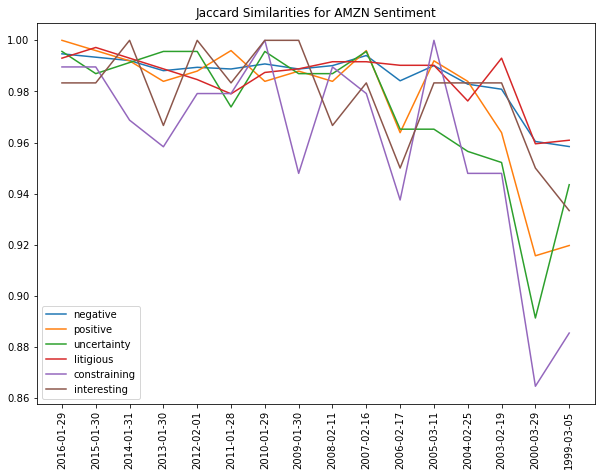

In [38]:
# Get dates for the universe
file_dates = {
    ticker: [ten_k['file_date'] for ten_k in ten_ks]
    for ticker, ten_ks in ten_ks_by_ticker.items()}  

jaccard_similarities = {
    ticker: {
        sentiment_name: get_jaccard_similarity(sentiment_values)
        for sentiment_name, sentiment_values in ten_k_sentiments.items()}
    for ticker, ten_k_sentiments in sentiment_bow_ten_ks.items()}


project_helper.plot_similarities(
    [jaccard_similarities[example_ticker][sentiment] for sentiment in sentiments],
    file_dates[example_ticker][1:],
    'Jaccard Similarities for {} Sentiment'.format(example_ticker),
    sentiments)

### TFIDF
using the sentiment word lists, let's generate sentiment TFIDF from the 10-k documents. Implement `get_tfidf` to generate TFIDF from each document, using sentiment words as the terms. You can ignore words that are not in `sentiment_words`.

In [40]:
from sklearn.feature_extraction.text import TfidfVectorizer


def get_tfidf(sentiment_words, docs):
    """
    Generate TFIDF values from documents for a certain sentiment

    Parameters
    ----------
    sentiment_words: Pandas Series
        Words that signify a certain sentiment
    docs : list of str
        List of documents used to generate bag of words

    Returns
    -------
    tfidf : 2-d Numpy Ndarray of float
        TFIDF sentiment for each document
        The first dimension is the document.
        The second dimension is the word.
    """
    
    # TODO: Implement
    vectorized = TfidfVectorizer(vocabulary = sentiment_words)
    
    tfidf = vectorized.fit_transform(docs).toarray()
    
    return tfidf


project_tests.test_get_tfidf(get_tfidf)

Tests Passed


Using the `get_tfidf` function, let's generate the TFIDF values for all the documents.

In [41]:
sentiment_tfidf_ten_ks = {}

for ticker, ten_ks in ten_ks_by_ticker.items():
    lemma_docs = [' '.join(ten_k['file_lemma']) for ten_k in ten_ks]
    
    sentiment_tfidf_ten_ks[ticker] = {
        sentiment: get_tfidf(sentiment_df[sentiment_df[sentiment]]['word'], lemma_docs)
        for sentiment in sentiments}

    
project_helper.print_ten_k_data([sentiment_tfidf_ten_ks[example_ticker]], sentiments)

[
  {
    negative: '[[ 0.          0.          0.         ...,  0.   ...
    positive: '[[ 0.22288432  0.          0.         ...,  0.   ...
    uncertainty: '[[ 0.          0.          0.         ...,  0.005...
    litigious: '[[ 0.  0.  0. ...,  0.  0.  0.]\n [ 0.  0.  0. .....
    constraining: '[[ 0.          0.          0.         ...,  0.   ...
    interesting: '[[ 0.01673784  0.          0.         ...,  0.   ...},
]


### Cosine Similarity
Using the TFIDF values, we'll calculate the cosine similarity and plot it over time. Implement `get_cosine_similarity` to return the cosine similarities between each tick in time. Since the input, `tfidf_matrix`, is a TFIDF vector for each time period in order, you just need to computer the cosine similarities for each neighboring vector.

In [43]:
from sklearn.metrics.pairwise import cosine_similarity


def get_cosine_similarity(tfidf_matrix):
    """
    Get cosine similarities for each neighboring TFIDF vector/document

    Parameters
    ----------
    tfidf : 2-d Numpy Ndarray of float
        TFIDF sentiment for each document
        The first dimension is the document.
        The second dimension is the word.

    Returns
    -------
    cosine_similarities : list of float
        Cosine similarities for neighboring documents
    """
    
    # TODO: Implement
    
    cosine_similarities = []
    
    for i in range(len(tfidf_matrix)-1):
        cosine_similarities.append(cosine_similarity(tfidf_matrix)[i][i+1])
    
    return cosine_similarities


project_tests.test_get_cosine_similarity(get_cosine_similarity)

Tests Passed


Let's plot the cosine similarities over time.

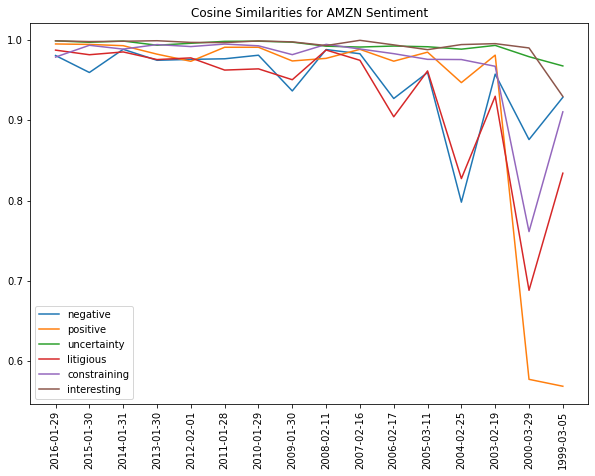

In [44]:
cosine_similarities = {
    ticker: {
        sentiment_name: get_cosine_similarity(sentiment_values)
        for sentiment_name, sentiment_values in ten_k_sentiments.items()}
    for ticker, ten_k_sentiments in sentiment_tfidf_ten_ks.items()}


project_helper.plot_similarities(
    [cosine_similarities[example_ticker][sentiment] for sentiment in sentiments],
    file_dates[example_ticker][1:],
    'Cosine Similarities for {} Sentiment'.format(example_ticker),
    sentiments)

## Evaluate Alpha Factors
Just like we did in project 4, let's evaluate the alpha factors. For this section, we'll just be looking at the cosine similarities, but it can be applied to the jaccard similarities as well.
### Price Data
Let's get yearly pricing to run the factor against, since 10-Ks are produced annually.

In [47]:
pricing = pd.read_csv('../../data/project_5_yr/yr-quotemedia.csv', parse_dates=['date'])
pricing = pricing.pivot(index='date', columns='ticker', values='adj_close')


pricing

KeyError: 'adj_close'

### Dict to DataFrame
The alphalens library uses dataframes, so we we'll need to turn our dictionary into a dataframe. 

In [45]:
cosine_similarities_df_dict = {'date': [], 'ticker': [], 'sentiment': [], 'value': []}


for ticker, ten_k_sentiments in cosine_similarities.items():
    for sentiment_name, sentiment_values in ten_k_sentiments.items():
        for sentiment_values, sentiment_value in enumerate(sentiment_values):
            cosine_similarities_df_dict['ticker'].append(ticker)
            cosine_similarities_df_dict['sentiment'].append(sentiment_name)
            cosine_similarities_df_dict['value'].append(sentiment_value)
            cosine_similarities_df_dict['date'].append(file_dates[ticker][1:][sentiment_values])

cosine_similarities_df = pd.DataFrame(cosine_similarities_df_dict)
cosine_similarities_df['date'] = pd.DatetimeIndex(cosine_similarities_df['date']).year
cosine_similarities_df['date'] = pd.to_datetime(cosine_similarities_df['date'], format='%Y')


cosine_similarities_df.head()

,date,sentiment,ticker,value
0,2016-01-01,negative,AMZN,0.98065125
1,2015-01-01,negative,AMZN,0.95951741
2,2014-01-01,negative,AMZN,0.98838551
3,2013-01-01,negative,AMZN,0.97472377
4,2012-01-01,negative,AMZN,0.97585100


### Alphalens Format
In order to use a lot of the alphalens functions, we need to aligned the indices and convert the time to unix timestamp. In this next cell, we'll do just that.

In [ ]:
import alphalens as al


factor_data = {}
skipped_sentiments = []

for sentiment in sentiments:
    cs_df = cosine_similarities_df[(cosine_similarities_df['sentiment'] == sentiment)]
    cs_df = cs_df.pivot(index='date', columns='ticker', values='value')

    try:
        data = al.utils.get_clean_factor_and_forward_returns(cs_df.stack(), pricing, quantiles=5, bins=None, periods=[1])
        factor_data[sentiment] = data
    except:
        skipped_sentiments.append(sentiment)

if skipped_sentiments:
    print('\nSkipped the following sentiments:\n{}'.format('\n'.join(skipped_sentiments)))
factor_data[sentiments[0]].head()

### Alphalens Format with Unix Time
Alphalen's `factor_rank_autocorrelation` and `mean_return_by_quantile` functions require unix timestamps to work, so we'll also create factor dataframes with unix time.

In [ ]:
unixt_factor_data = {
    factor: data.set_index(pd.MultiIndex.from_tuples(
        [(x.timestamp(), y) for x, y in data.index.values],
        names=['date', 'asset']))
    for factor, data in factor_data.items()}

### Factor Returns
Let's view the factor returns over time. We should be seeing it generally move up and to the right.

In [ ]:
ls_factor_returns = pd.DataFrame()

for factor_name, data in factor_data.items():
    ls_factor_returns[factor_name] = al.performance.factor_returns(data).iloc[:, 0]

(1 + ls_factor_returns).cumprod().plot()

### Basis Points Per Day per Quantile
It is not enough to look just at the factor weighted return. A good alpha is also monotonic in quantiles. Let's looks the basis points for the factor returns.

In [ ]:
qr_factor_returns = pd.DataFrame()

for factor_name, data in unixt_factor_data.items():
    qr_factor_returns[factor_name] = al.performance.mean_return_by_quantile(data)[0].iloc[:, 0]

(10000*qr_factor_returns).plot.bar(
    subplots=True,
    sharey=True,
    layout=(5,3),
    figsize=(14, 14),
    legend=False)

### Turnover Analysis
Without doing a full and formal backtest, we can analyze how stable the alphas are over time. Stability in this sense means that from period to period, the alpha ranks do not change much. Since trading is costly, we always prefer, all other things being equal, that the ranks do not change significantly per period. We can measure this with the **Factor Rank Autocorrelation (FRA)**.

In [ ]:
ls_FRA = pd.DataFrame()

for factor, data in unixt_factor_data.items():
    ls_FRA[factor] = al.performance.factor_rank_autocorrelation(data)

ls_FRA.plot(title="Factor Rank Autocorrelation")

### Sharpe Ratio of the Alphas
The last analysis we'll do on the factors will be sharpe ratio. Let's see what the sharpe ratio for the factors are. Generally, a Sharpe Ratio of near 1.0 or higher is an acceptable single alpha for this universe.

In [ ]:
daily_annualization_factor = np.sqrt(252)

(daily_annualization_factor * ls_factor_returns.mean() / ls_factor_returns.std()).round(2)

That's it! You've successfully done sentiment analysis on 10-ks!
## Submission
Now that you're done with the project, it's time to submit it. Click the submit button in the bottom right. One of our reviewers will give you feedback on your project with a pass or not passed grade. You can continue to the next section while you wait for feedback.